7 0


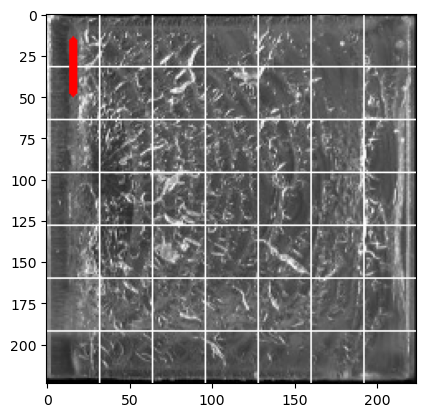

28 35


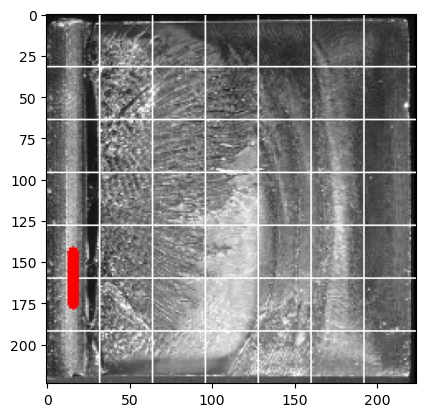

3 4


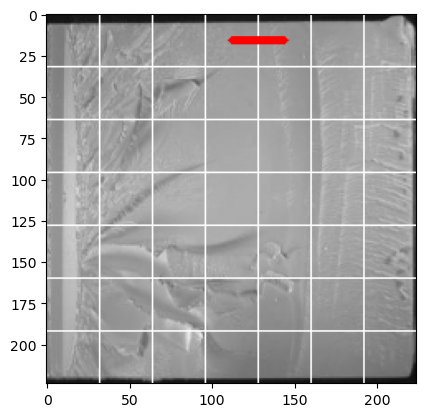

7 0


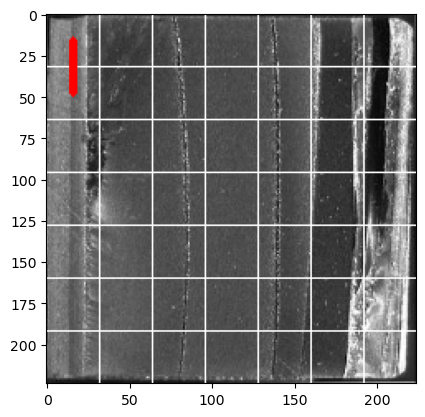

5 4


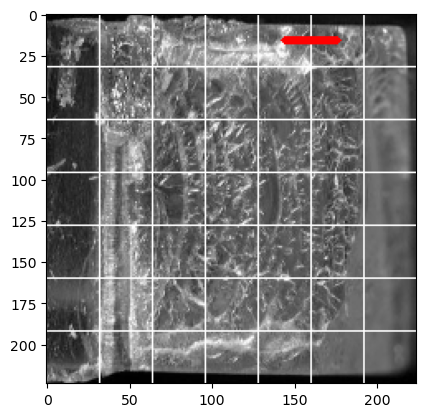

43 44


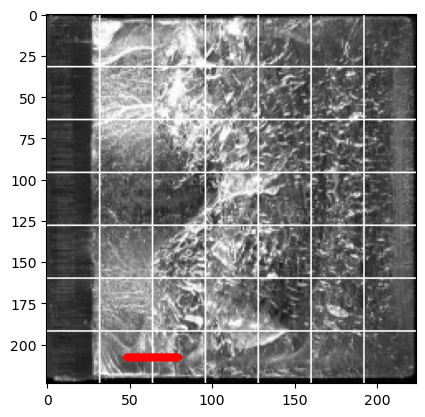

5 4


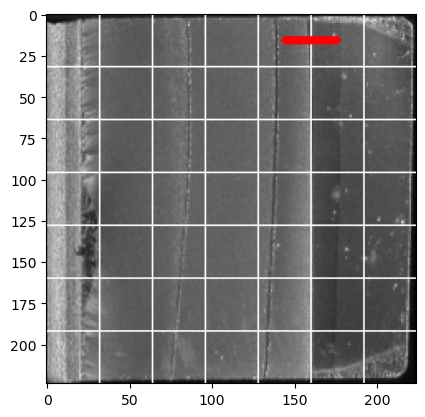

21 14


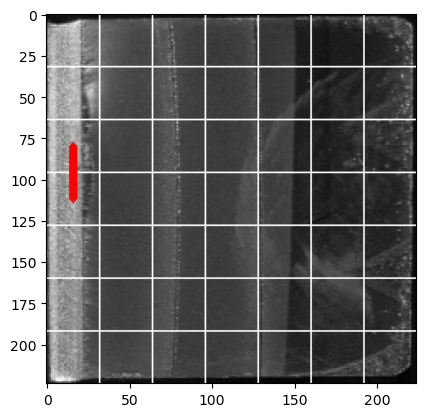

35 28


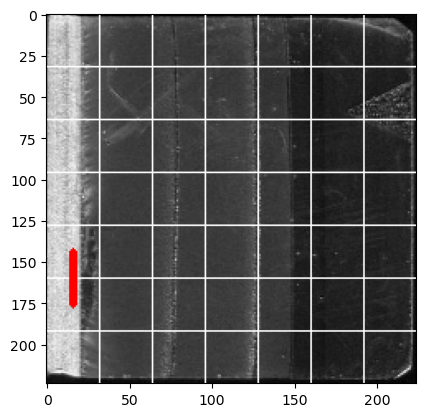

35 28


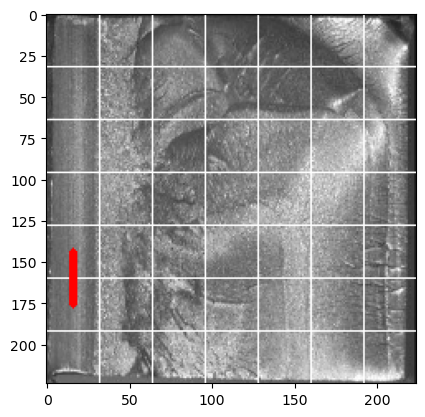

28 21


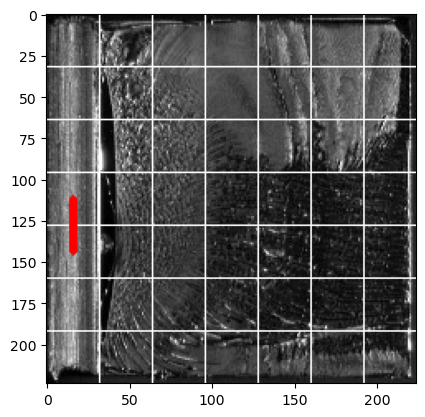

4 5


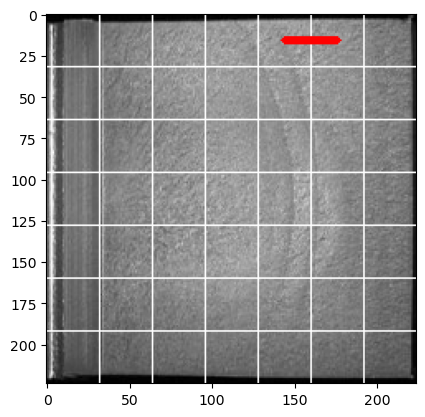

34 27


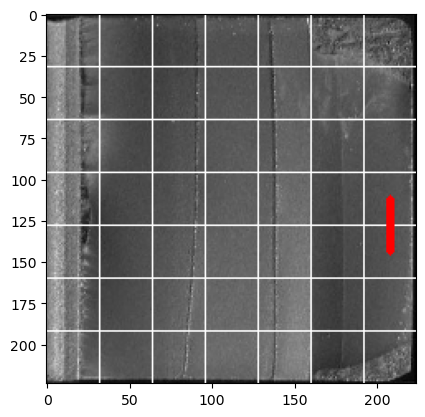

3 4


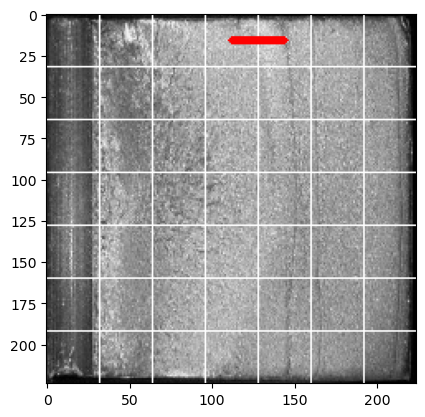

44 43


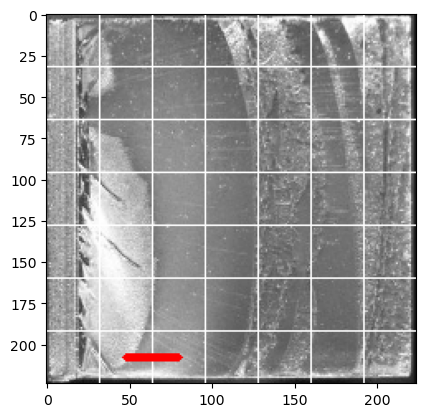

21 28


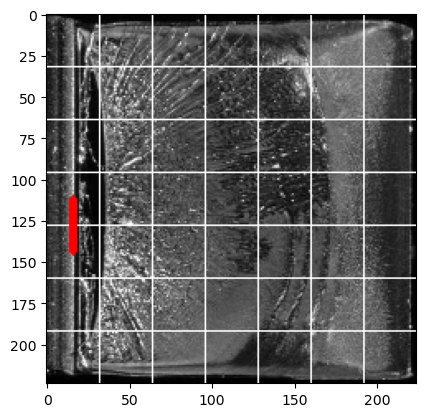

13 20


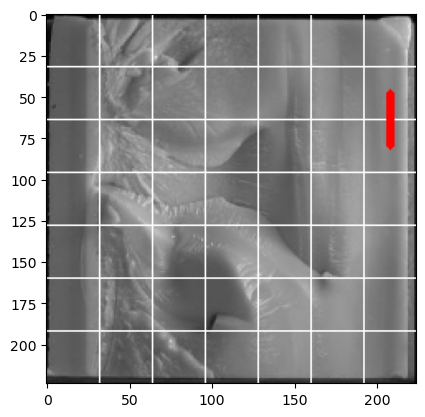

35 7


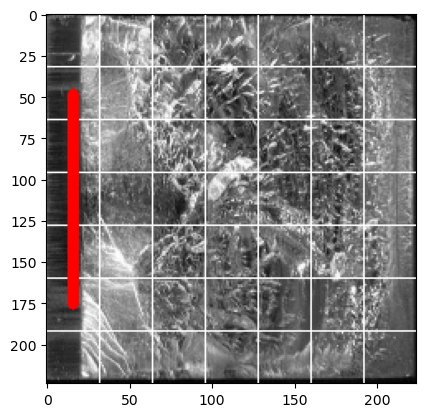

35 28


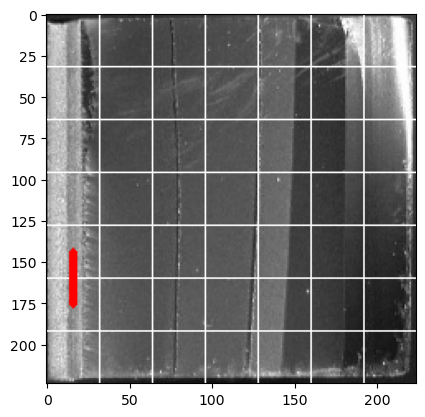

7 14


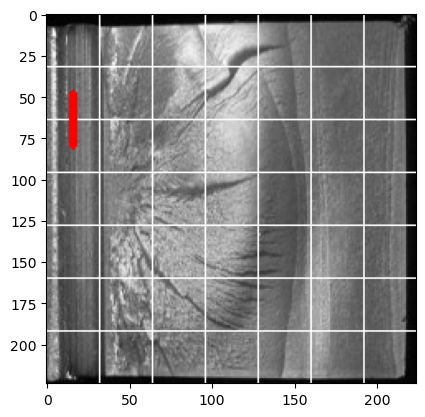

2 1


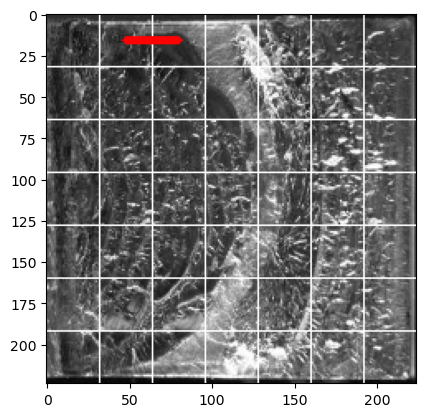

7 14


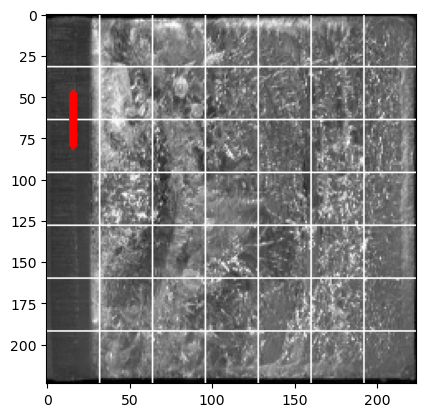

45 46


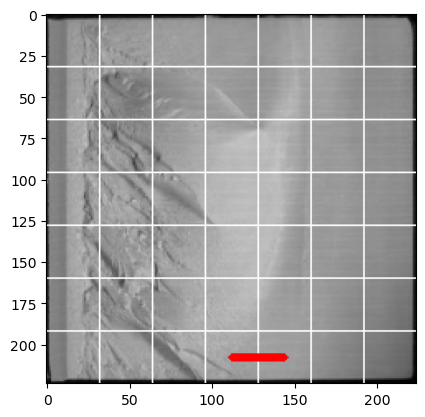

21 14


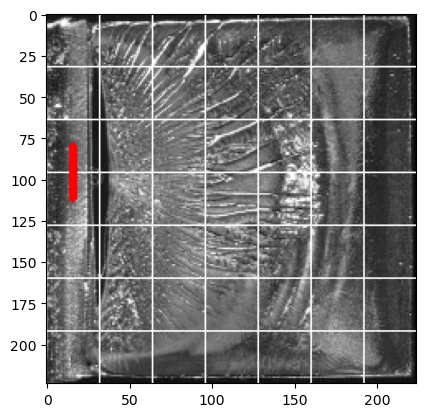

44 45


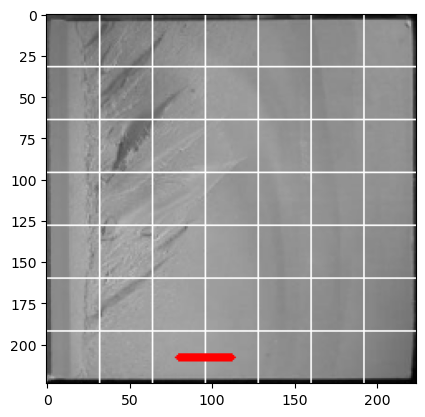

27 20


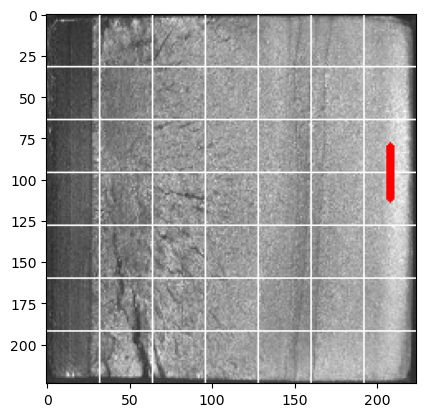

0 7


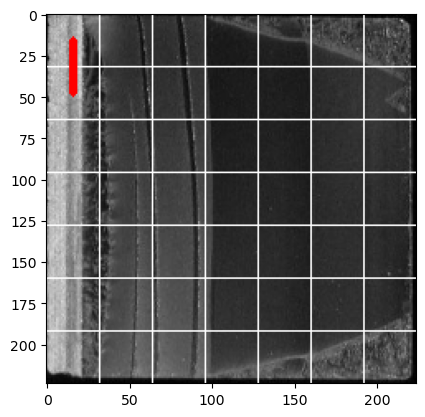

2 1


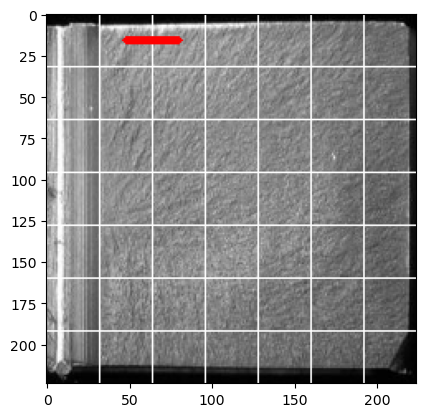

1 3


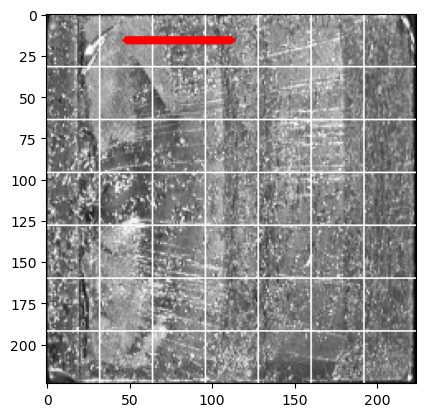

In [14]:
import numpy as np
import pandas as pd 
import cv2
import matplotlib.pyplot as plt

df = pd.read_csv('./Causal_Analysis/data/aw_better.csv')
better_id = pd.read_csv('./Causal_Analysis/data/better_id.csv')

step = 32
img_y, img_x = 224, 224

for n, i in enumerate(better_id.values.tolist()):
    path = '/home/yamanaka/Estimate_KIc_with_ViT/Mototake_Analysis/VGG+GP/imagedata/' + str(i[0]) + '.jpg'
    aw = df.iloc[n].values.reshape(16, 49, 49)
    aw_mean = aw.mean(axis=0)
    for j in range(49):
        aw_mean[j, j] = 0
    aw_max = aw.max()*5
    xy = np.argmax(aw_mean) 
    x, y = xy % 49, xy // 49
    print(x, y)
    xi, xj = x%7, x//7
    yi, yj = y%7, y//7

    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (img_x, img_y))

    img[step:img_y:step, :, :] = 255
    img[:, step:img_x:step, :] = 255

    cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (255, 0, 0), thickness=int(aw_max), lineType=cv2.LINE_4)

    plt.imshow(img)
    plt.show()

In [33]:
better_id

0     100097
1     100102
2     100105
3     100119
4     100126
5     100127
6     100129
7     100135
8     100145
9     100150
10    100151
11    100159
12    100161
13    100163
14    100164
15    100170
16    100174
17    100175
18    100176
19    100177
20    100180
21    100183
22    100185
23    100199
24    100203
25    100214
26    100223
27    100225
28    100240
29    100244
Name: Id, dtype: int64

0.9999783277511597


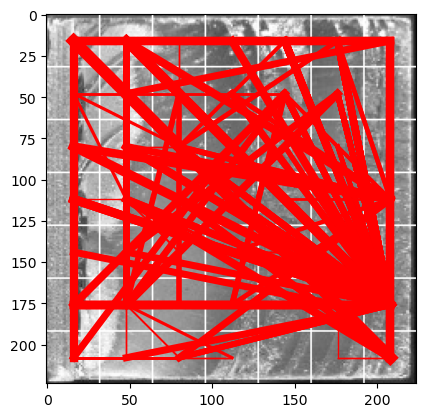

0.9999788522720336


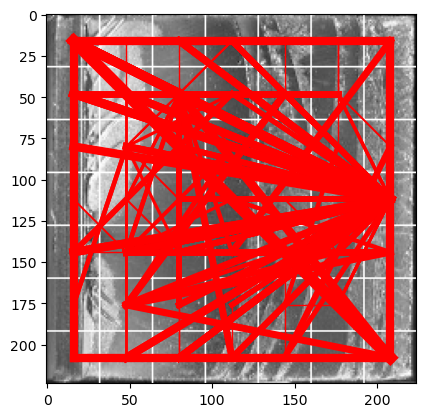

0.9999969244003296


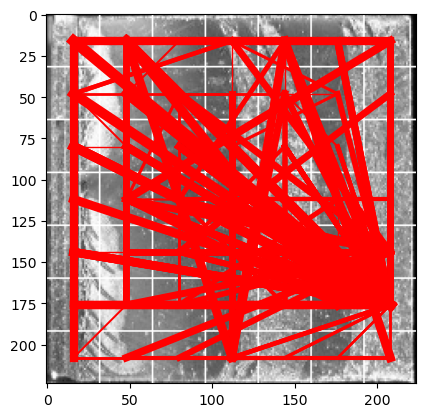

0.9999959707260132


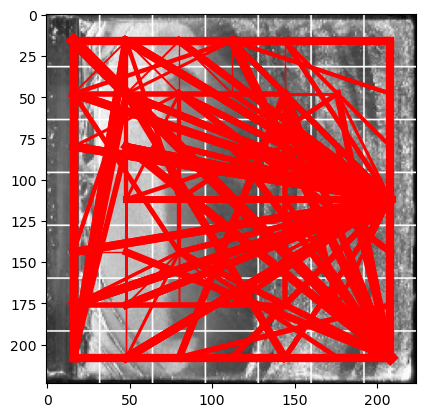

0.9999979257583618


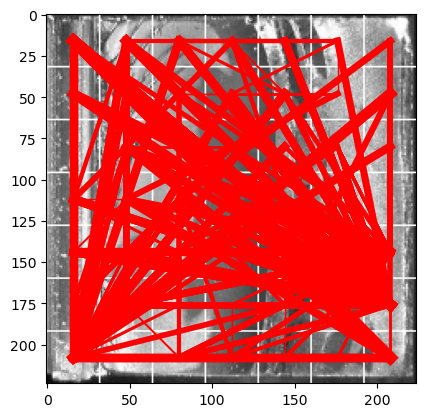

0.9999767780303955


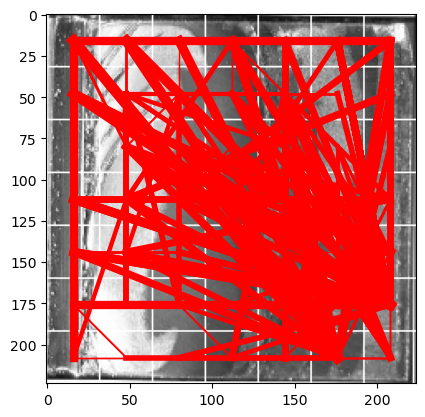

0.9999803304672241


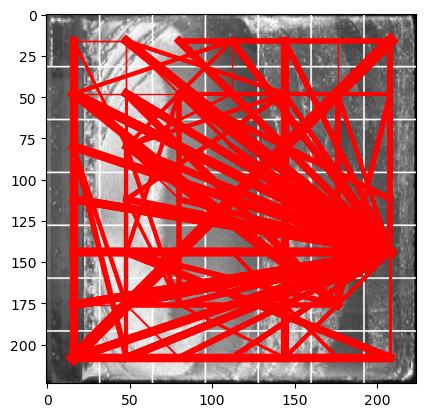

0.9999998331069946


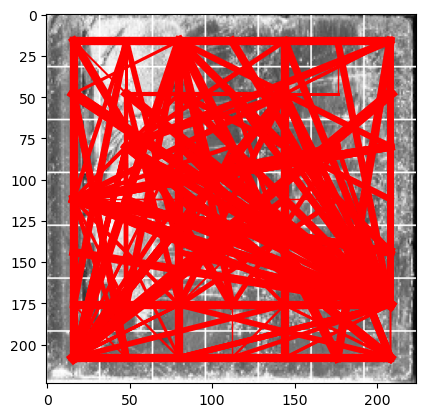

0.9999289870262146


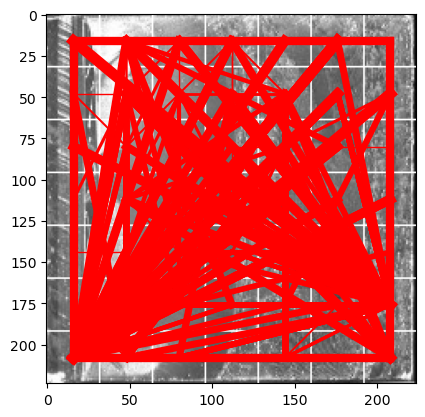

0.9999958753585816


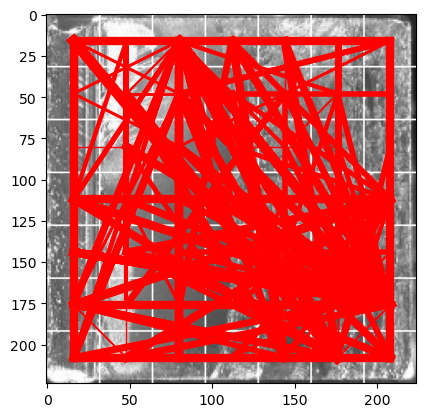

0.9999818325042724


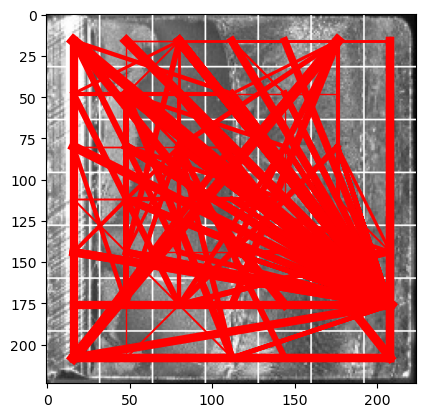

0.999996566772461


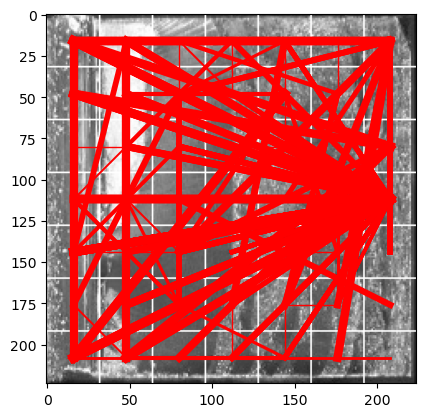

0.9999836921691895


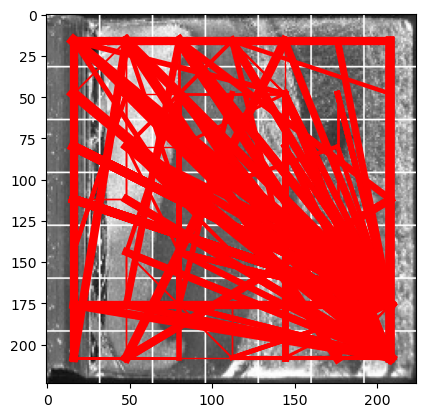

0.999996566772461


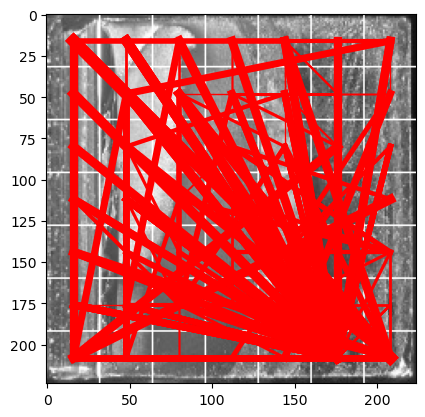

0.9999921321868896


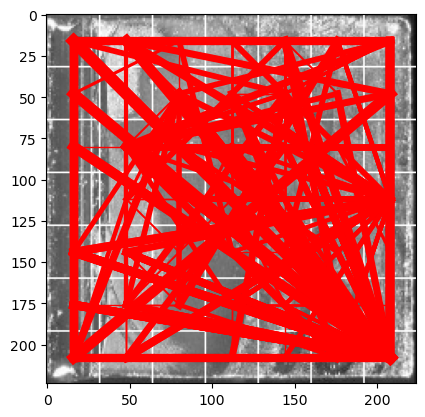

0.9999983072280884


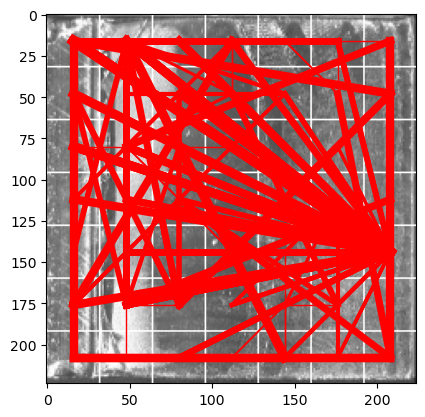

0.9999936103820801


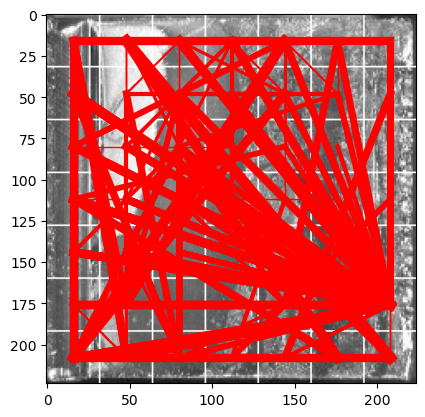

0.9999969720840454


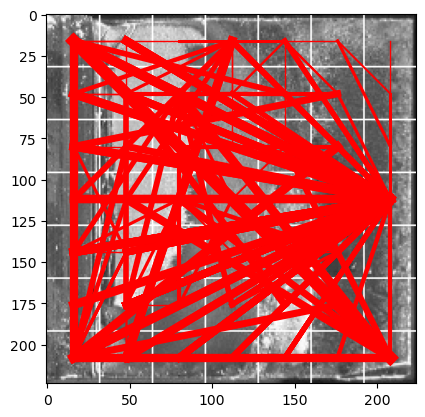

0.9999866962432862


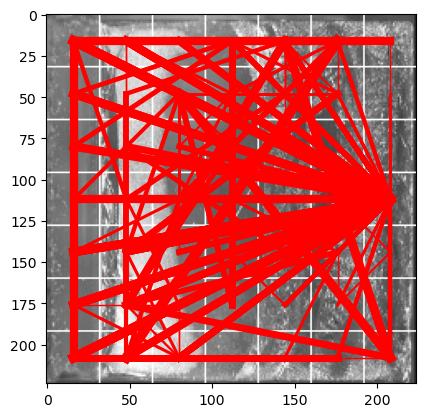

0.9999387741088868


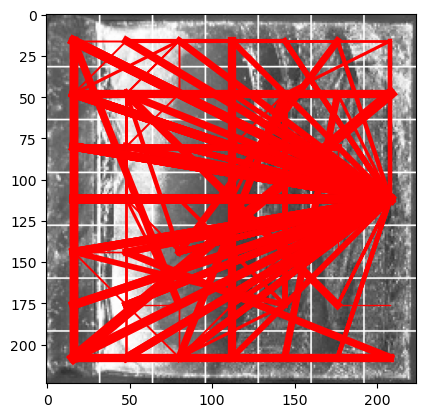

0.9999995946884155


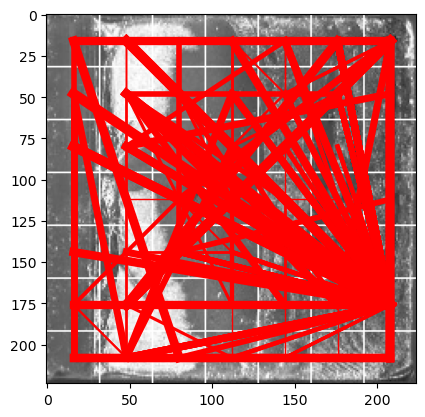

0.9999276161193847


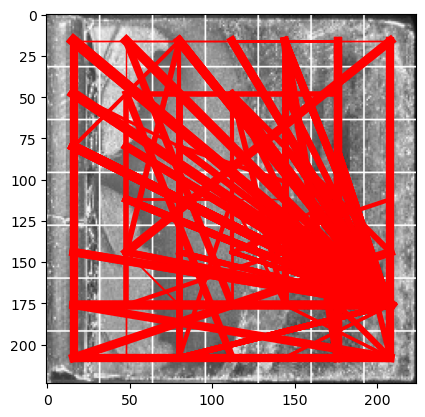

0.999996829032898


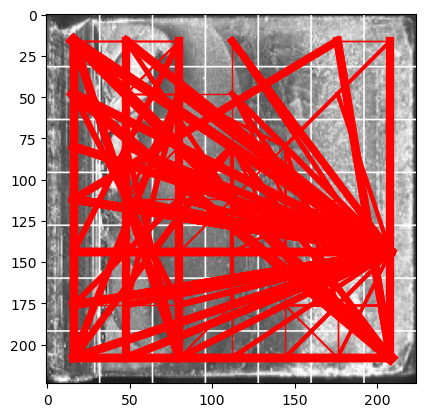

0.9998471021652222


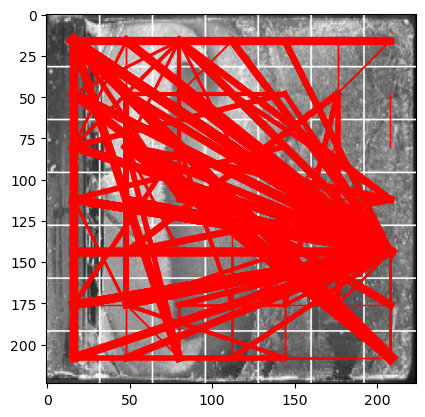

0.9999348402023316


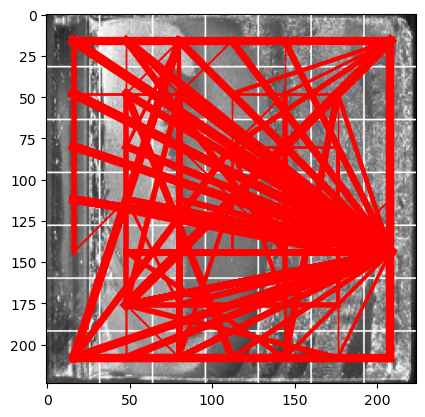

0.999996566772461


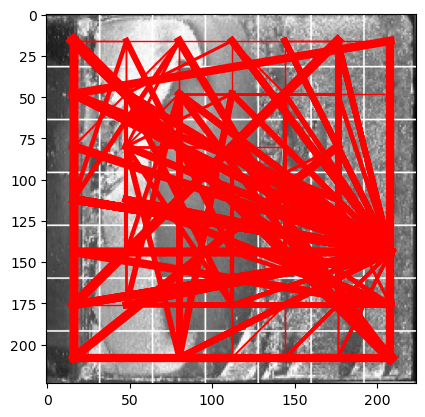

0.9999711990356446


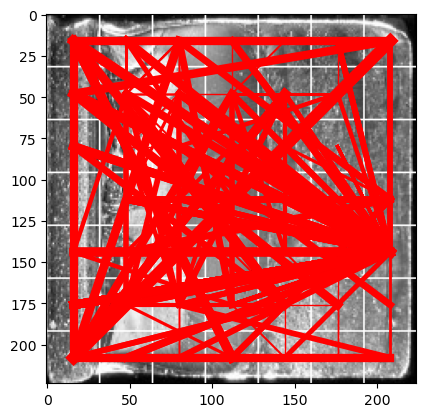

0.9999924659729004


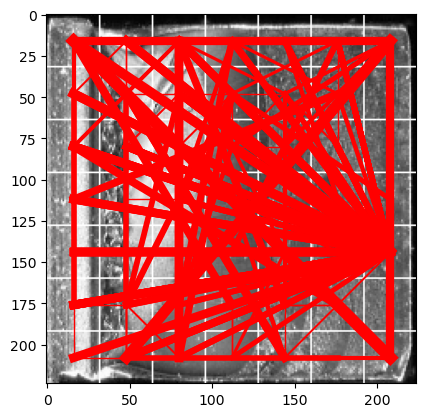

0.9999907732009887


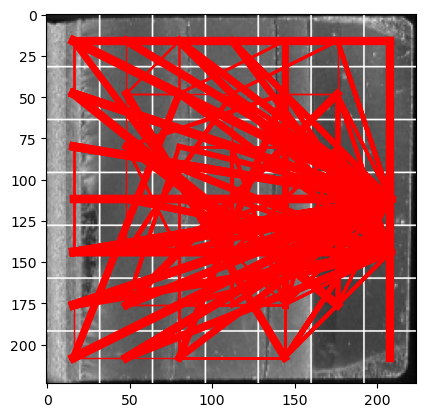

0.9999999284744263


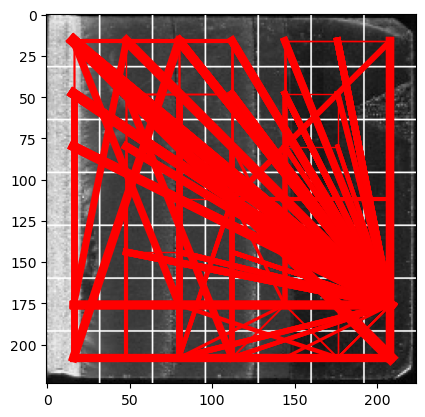

<Figure size 640x480 with 0 Axes>

In [26]:
import numpy as np
import pandas as pd 
import cv2
import matplotlib.pyplot as plt

ad_npy = np.load('./Causal_Analysis/data/aw_allpth_ymax_4949.npy')
better_id = pd.read_csv('./KIc/Model/vit/vit_large_patch32_224_Kfold_seed42_oof_df.csv')['Id'].head(30)

step = 32
img_y, img_x = 224, 224

for n, i in enumerate(better_id.values.tolist()):
    path = '/home/yamanaka/Estimate_KIc_with_ViT/Mototake_Analysis/VGG+GP/imagedata/' + str(i) + '.jpg'
    
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (img_x, img_y))
    img[step:img_y:step, :, :] = 255
    img[:, step:img_x:step, :] = 255

    all_ad_max = 0
    all_ad = 0

    for j in range(384):
        ad = ad_npy[n, j]
        # print(ad.shape)
        # for j in range(49):
        #     ad[j, j] = 0
        ad_max = ad.max()
        x, y = np.unravel_index(np.argmax(ad, axis=None), ad.shape)
        # print(ad_max)
        if ad_max > all_ad_max:
            all_ad_max = ad_max
            all_ad = ad
            # print(x, y)
        # xy = np.argmax(ad) 
        # x, y = xy % 49, xy // 49
        # print(x, y)
        xi, xj = x//7, x%7
        # print(xi, xj)
        yi, yj = y//7, y%7

        len_aw = np.linalg.norm([xi - yi, xj - yj])

        # if ad_max < 30: 
            
        plt.plot((16+(32*xj), 16+(32*yj)), (16+(32*xi), 16+(32*yi)), color="red", linewidth=len_aw)
        # if 30 <= ad_max < 60: plt.plot((16+(32*xj), 16+(32*yj)), (16+(32*xi), 16+(32*yi)), color="red", linewidth=1)
        # if 60 <= ad_max < 90: plt.plot((16+(32*xj), 16+(32*yj)), (16+(32*xi), 16+(32*yi)), color="red", linewidth=4)
        # if 90 <= ad_max : plt.plot((16+(32*xj), 16+(32*yj)), (16+(32*xi), 16+(32*yi)), color="red", linewidth=10)
        # if j == 0: break
        
        # if ad_max < 30: cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (50, 0, 0), thickness=1, lineType=cv2.LINE_4)
        # if 30 <= ad_max < 60: cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (100, 0, 0), thickness=2, lineType=cv2.LINE_4)
        # if 60 <= ad_max < 90: cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (150, 0, 0), thickness=3, lineType=cv2.LINE_4)
        # if 90 <= ad_max : cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (255, 0, 0), thickness=4, lineType=cv2.LINE_4)
        
    # xy = np.argmax(all_ad)
    print(all_ad_max)
    # x, y = xy % 49, xy // 49
    # xi, xj = x%7, x//7
    # yi, yj = y%7, y//7
    # cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (255, 0, 0), thickness=3, lineType=cv2.LINE_4)
    plt.imshow(img)
    plt.show()
    plt.clf()

113.054296875


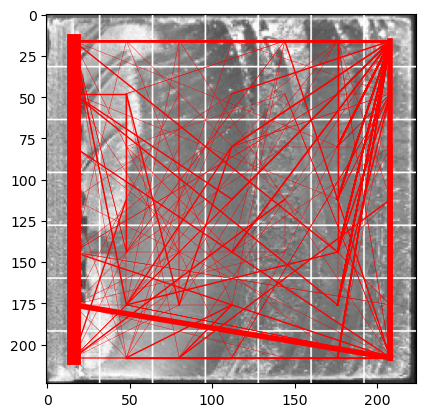

131.2382698059082


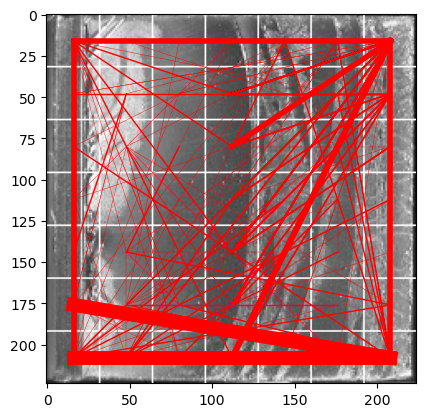

101.8329288482666


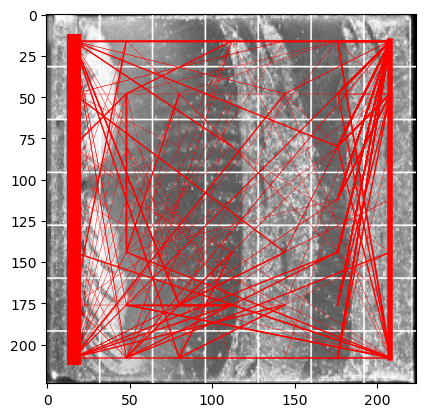

116.08119010925293


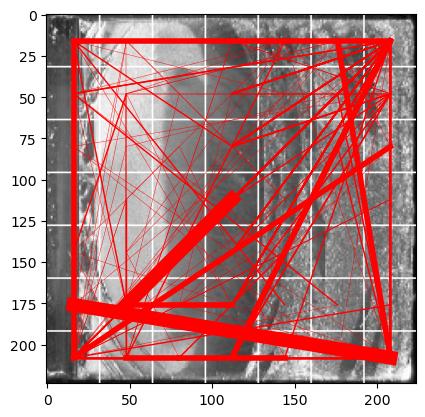

122.6385108947754


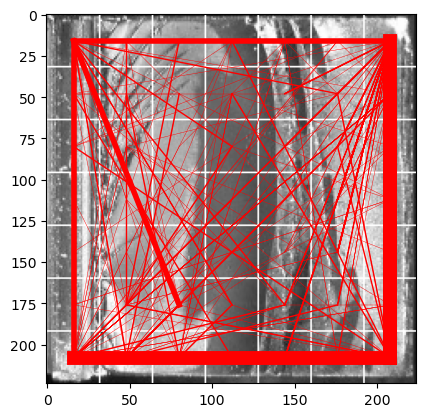

99.34892463684082


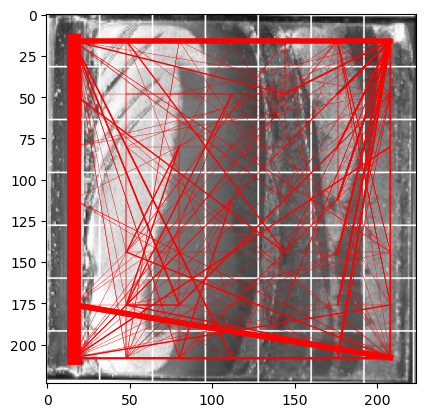

116.15595932006836


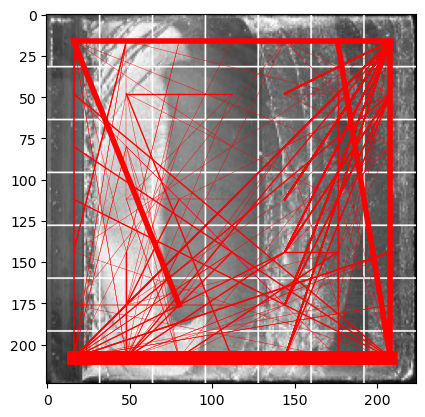

140.05925216674805


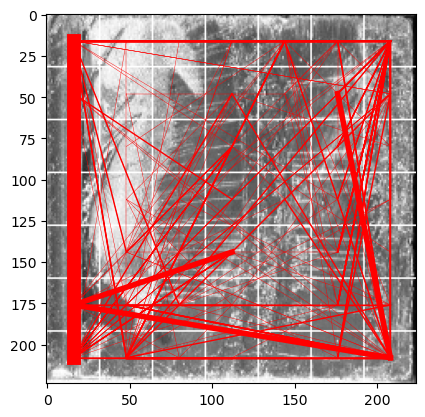

124.89151611328126


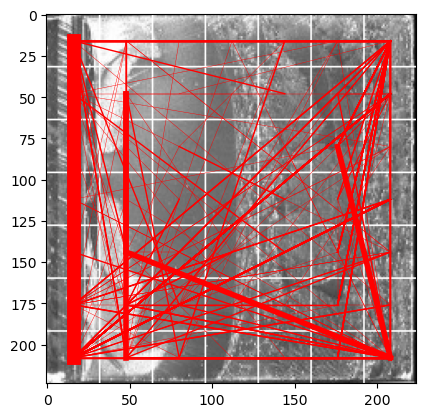

117.3791404724121


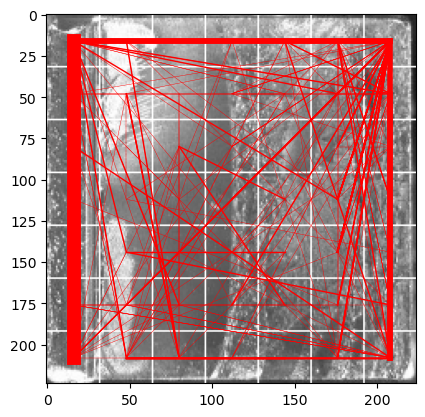

136.39701232910156


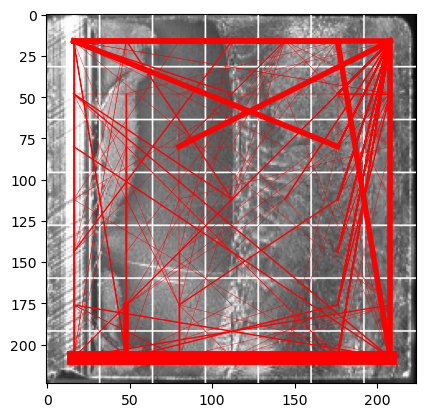

104.46826972961426


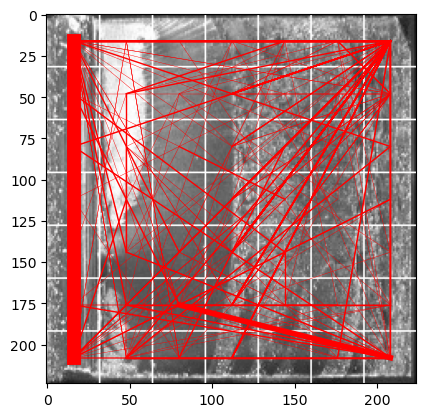

107.05939178466797


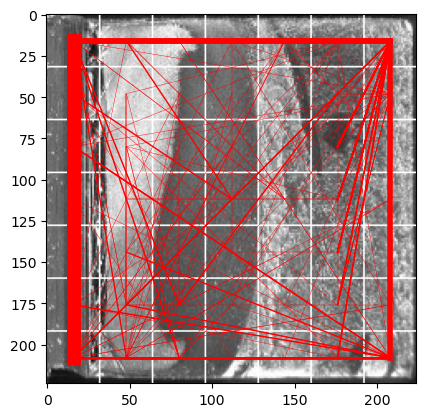

107.67976455688476


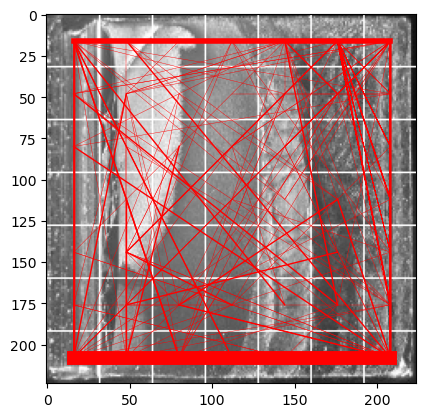

120.78385620117187


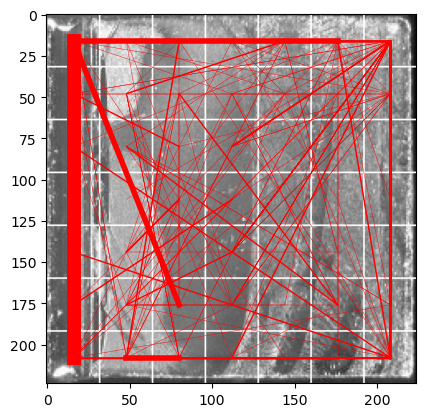

116.37960319519043


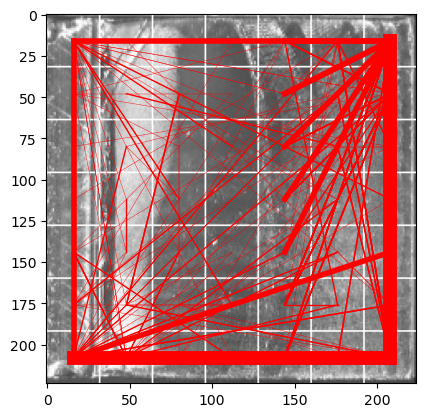

125.24858093261719


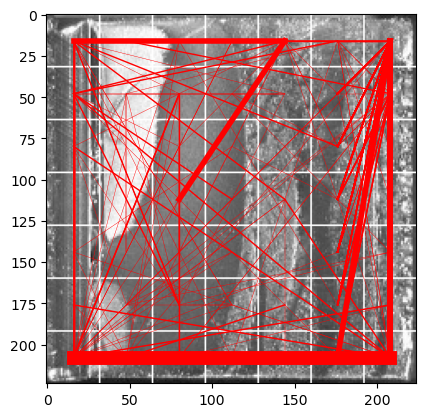

104.50396385192872


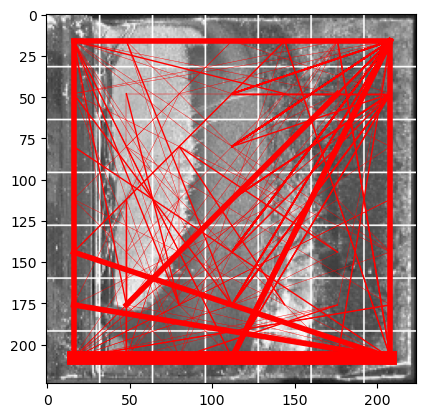

120.55178146362304


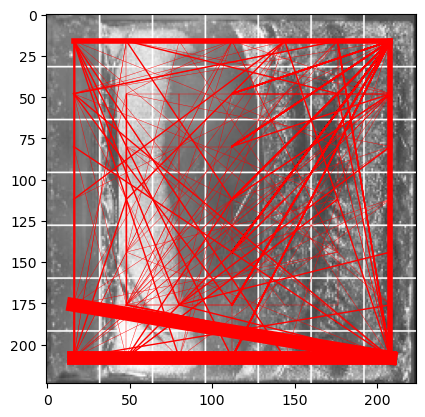

98.05957374572753


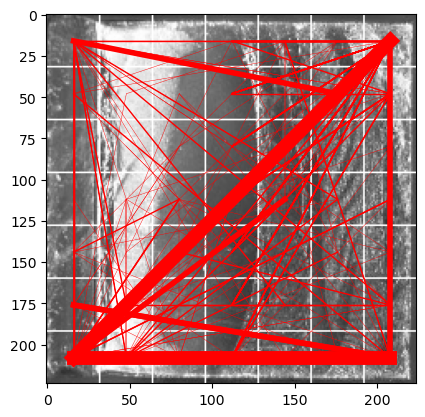

101.69431915283204


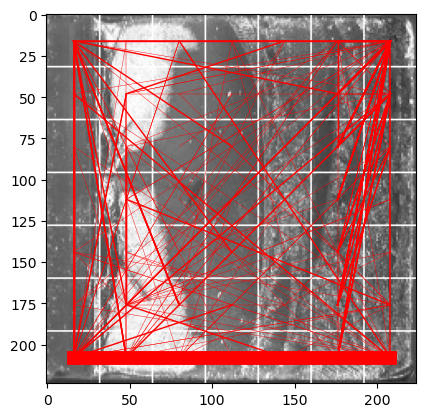

90.95979766845703


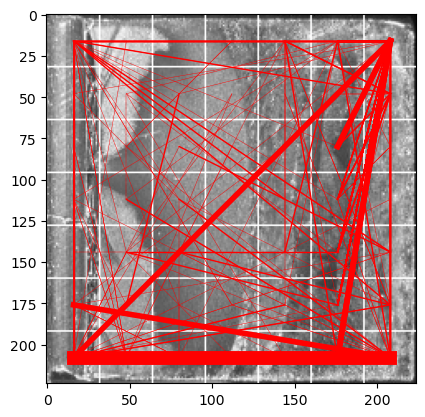

101.45636672973633


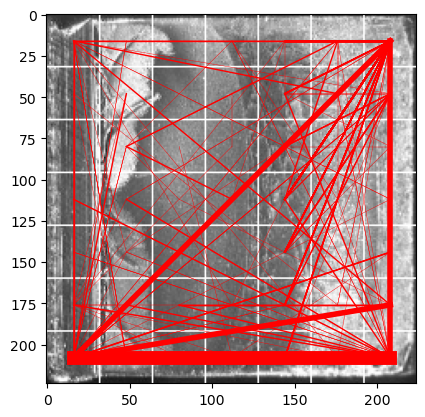

106.60910911560059


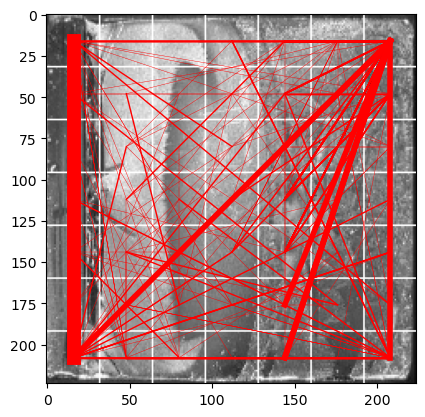

109.9925594329834


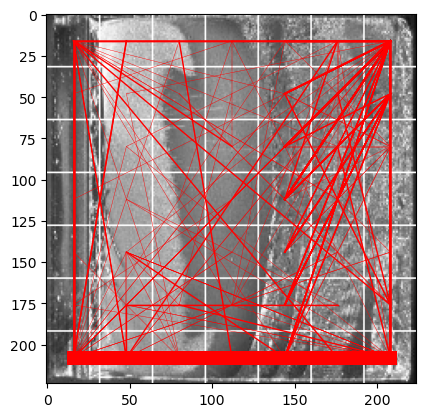

90.68106994628906


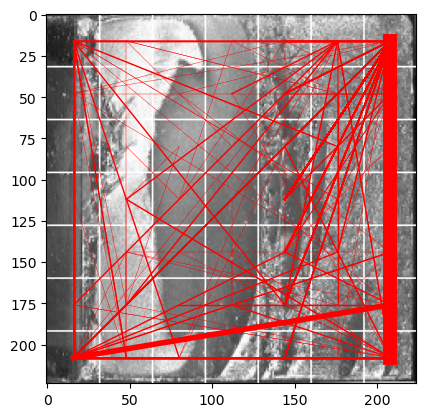

128.62022552490234


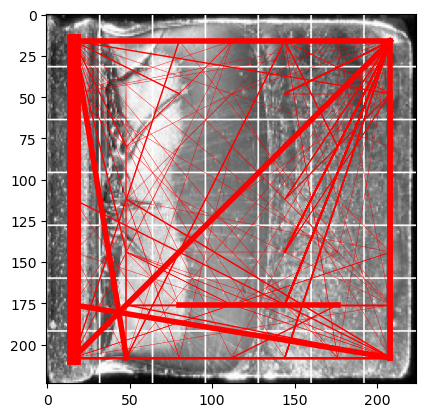

109.50439109802247


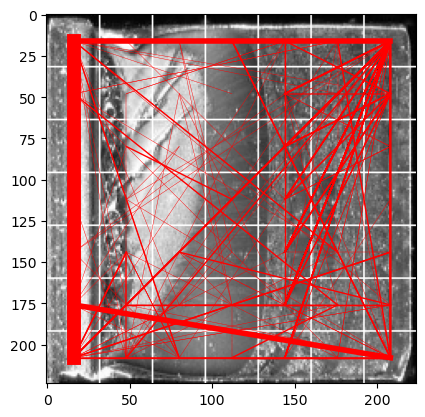

111.67999649047852


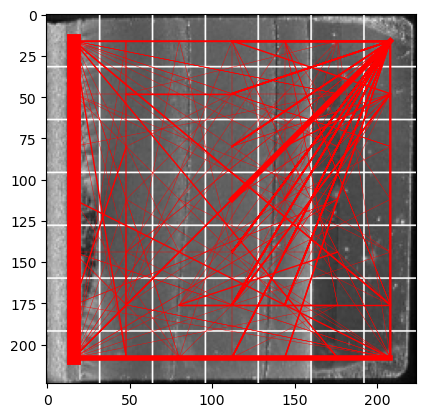

99.40423278808593


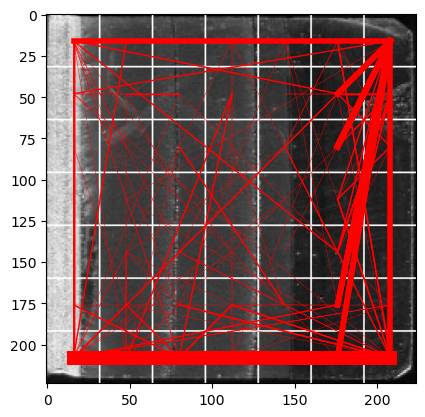

In [ ]:
import numpy as np
import pandas as pd 
import cv2
import matplotlib.pyplot as plt

ad_npy = np.load('./Causal_Analysis/data/ad_allpth_ymax_4949.npy')
better_id = pd.read_csv('./KIc/Model/vit/vit_large_patch32_224_Kfold_seed42_oof_df.csv')['Id'].head(30)

step = 32
img_y, img_x = 224, 224

for n, i in enumerate(better_id.values.tolist()):
    path = '/home/yamanaka/Estimate_KIc_with_ViT/Mototake_Analysis/VGG+GP/imagedata/' + str(i) + '.jpg'
    
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (img_x, img_y))
    img[step:img_y:step, :, :] = 255
    img[:, step:img_x:step, :] = 255

    all_ad_max = 0
    all_ad = 0

    for j in range(384):
        ad = ad_npy[n, j]
        # print(ad)
        for j in range(49):
            ad[j, j] = 0
        ad_max = ad.max()
        # print(ad_max)
        if ad_max > all_ad_max:
            all_ad_max = ad_max
            all_ad = ad
        xy = np.argmax(ad) 
        x, y = xy % 49, xy // 49
        # print(x, y)
        xi, xj = x%7, x//7
        yi, yj = y%7, y//7

        if ad_max < 30: plt.plot((16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), color="red", linewidth=0.3)
        if 30 <= ad_max < 60: plt.plot((16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), color="red", linewidth=1)
        if 60 <= ad_max < 90: plt.plot((16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), color="red", linewidth=4)
        if 90 <= ad_max : plt.plot((16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), color="red", linewidth=10)
        
        # if ad_max < 30: cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (50, 0, 0), thickness=1, lineType=cv2.LINE_4)
        # if 30 <= ad_max < 60: cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (100, 0, 0), thickness=2, lineType=cv2.LINE_4)
        # if 60 <= ad_max < 90: cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (150, 0, 0), thickness=3, lineType=cv2.LINE_4)
        # if 90 <= ad_max : cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (255, 0, 0), thickness=4, lineType=cv2.LINE_4)
        
    # xy = np.argmax(all_ad)
    print(all_ad_max)
    # x, y = xy % 49, xy // 49
    # xi, xj = x%7, x//7
    # yi, yj = y%7, y//7
    # cv2.line(img, (16+(32*xi), 16+(32*xj)), (16+(32*yi), 16+(32*yj)), (255, 0, 0), thickness=3, lineType=cv2.LINE_4)
    plt.imshow(img)
    plt.show()